# By sepreating test and train data

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np
from sklearn.model_selection import train_test_split
from PIL import Image
import numpy as np
import keyboard

root_dir = r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet2"

class_directories = [os.path.join(root_dir, class_dir) for class_dir in os.listdir(root_dir)]

file_paths = []
labels = []

for class_dir in class_directories:
    label = os.path.basename(class_dir)
    class_file_paths = [os.path.join(class_dir, file) for file in os.listdir(class_dir)]
    file_paths.extend(class_file_paths)
    labels.extend([label] * len(class_file_paths))

file_paths = np.array(file_paths)
labels = np.array(labels)

X_train, X_test, y_train, y_test = train_test_split(file_paths, labels, test_size=0.2, random_state=42)

print("Training data shape:", X_train.shape, y_train.shape)
print("Testing data shape:", X_test.shape, y_test.shape)

model = Sequential([
    tf.keras.layers.Input(shape=(128, 128, 3)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(14, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1./255,
    brightness_range=[0.5, 1.5],  
    channel_shift_range=20,       
    vertical_flip=True,           
    fill_mode='nearest',          
    validation_split=0.2       
)

train_generator = train_datagen.flow_from_directory(
    root_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='sparse',
    subset='training'
)

steps_per_epoch = len(X_train) // 32

model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=15
)

test_generator = train_datagen.flow_from_directory(
    root_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)
# accuracy = model.evaluate(test_generator)
# print("Test Accuracy:", accuracy)


Found 2527 images belonging to 14 classes.
Epoch 1/15
78/78 [==============================] - 48s 594ms/step - loss: 1.8899 - accuracy: 0.3527
Epoch 2/15
78/78 [==============================] - 46s 587ms/step - loss: 0.8383 - accuracy: 0.7090
Epoch 3/15
78/78 [==============================] - 44s 559ms/step - loss: 0.5372 - accuracy: 0.8333
Epoch 4/15
78/78 [==============================] - 43s 544ms/step - loss: 0.4019 - accuracy: 0.8677
Epoch 5/15
78/78 [==============================] - 45s 572ms/step - loss: 0.2739 - accuracy: 0.9134
Epoch 6/15
78/78 [==============================] - 49s 625ms/step - loss: 0.4095 - accuracy: 0.8782
Epoch 7/15
78/78 [==============================] - 44s 559ms/step - loss: 0.1963 - accuracy: 0.9439
Epoch 8/15
78/78 [==============================] - 48s 611ms/step - loss: 0.1810 - accuracy: 0.9451
Epoch 9/15
78/78 [==============================] - 46s 586ms/step - loss: 0.1686 - accuracy: 0.9431
Epoch 10/15
78/78 [=============================

# Without Seperating test and train data

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np

root_dir = r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet2"

train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1./255,
    brightness_range=[0.5, 1.5],  
    channel_shift_range=20,       
    vertical_flip=True,           
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    root_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='sparse'
)

model = Sequential([
    tf.keras.layers.Input(shape=(128, 128, 3)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(14, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

steps_per_epoch = len(train_generator)

model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=15
)


Found 3152 images belonging to 14 classes.



Epoch 1/15


99/99 [==============================] - 58s 569ms/step - loss: 1.7641 - accuracy: 0.3905
Epoch 2/15
99/99 [==============================] - 55s 550ms/step - loss: 0.8164 - accuracy: 0.7392
Epoch 3/15
99/99 [==============================] - 57s 570ms/step - loss: 0.4885 - accuracy: 0.8484
Epoch 4/15
99/99 [==============================] - 66s 662ms/step - loss: 0.3916 - accuracy: 0.8785
Epoch 5/15
99/99 [==============================] - 62s 627ms/step - loss: 0.2224 - accuracy: 0.9331
Epoch 6/15
99/99 [==============================] - 57s 575ms/step - loss: 0.2392 - accuracy: 0.9235
Epoch 7/15
99/99 [==============================] - 53s 530ms/step - loss: 0.2486 - accuracy: 0.9210
Epoch 8/15
99/99 [==============================] - 56s 566ms/step - loss: 0.1945 - accuracy: 0.9407
Epoch 9/15
99/99 [==============================] - 58s 586ms/step - loss: 0.1564 - accuracy: 0.9461
Epoch 10/15
99/99 [=======================

In [2]:
from tensorflow.keras.models import save_model
save_model(model, r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")

C:\Users\SHARVIN JOSHI\AppData\Local\Temp\ipykernel_4528\344929621.py:2: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")





Found 3152 files belonging to 14 classes.
1/1 [==============================] - 0s 112ms/step


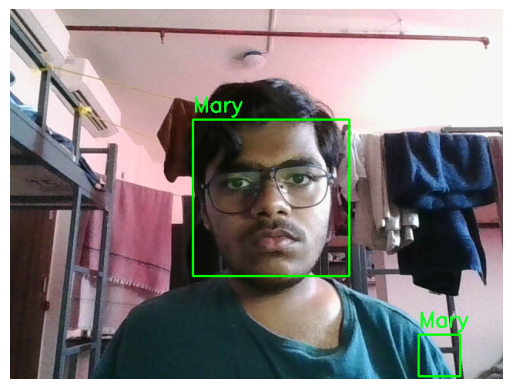

1/1 [==============================] - 0s 22ms/step


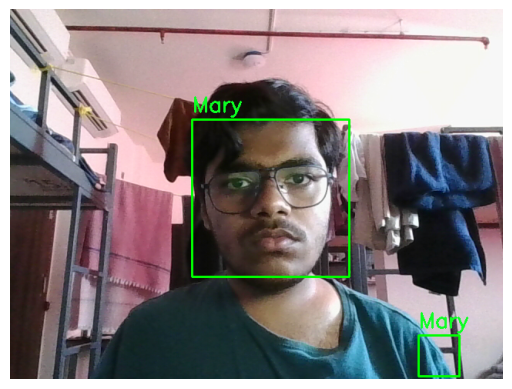

1/1 [==============================] - 0s 22ms/step


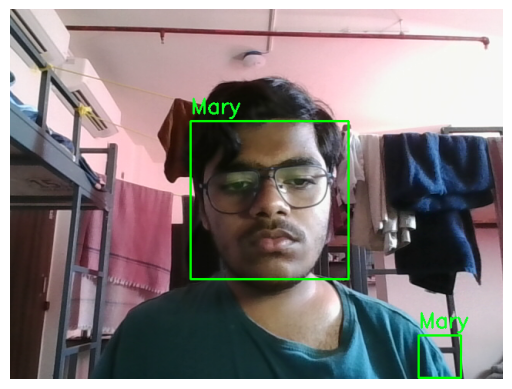

1/1 [==============================] - 0s 21ms/step


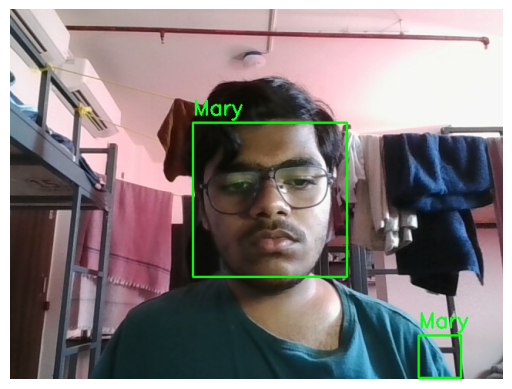

1/1 [==============================] - 0s 24ms/step


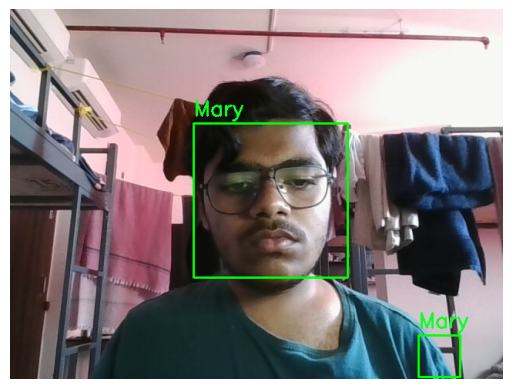

1/1 [==============================] - 0s 21ms/step


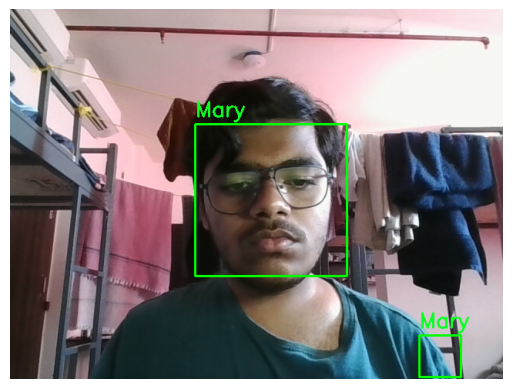

1/1 [==============================] - 0s 21ms/step


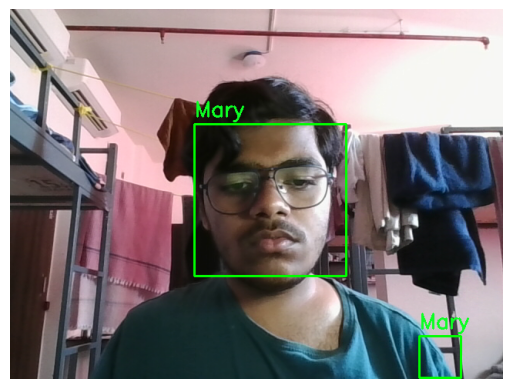

1/1 [==============================] - 0s 21ms/step


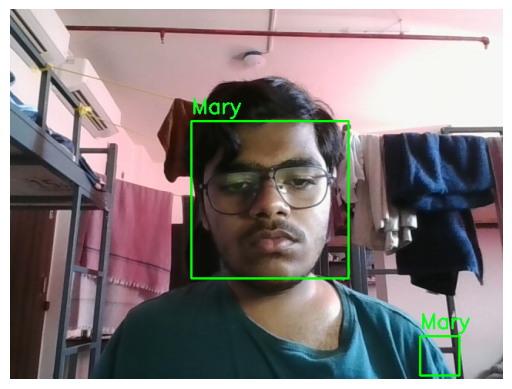

1/1 [==============================] - 0s 21ms/step


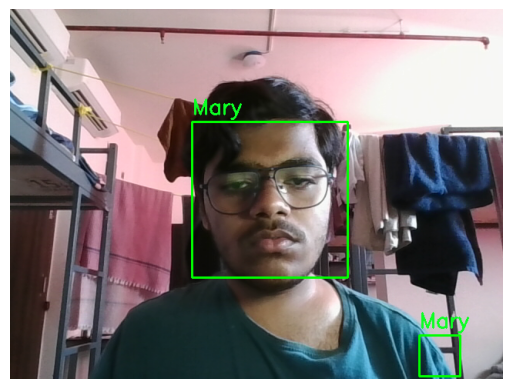

1/1 [==============================] - 0s 22ms/step


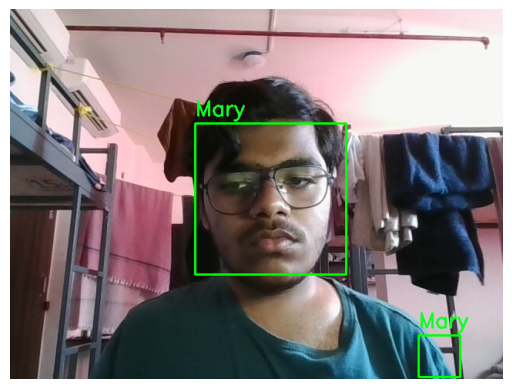

1/1 [==============================] - 0s 21ms/step


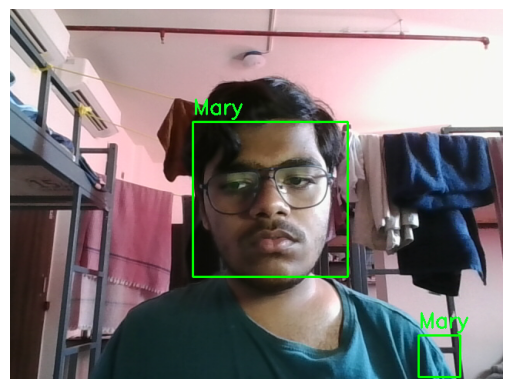

1/1 [==============================] - 0s 19ms/step


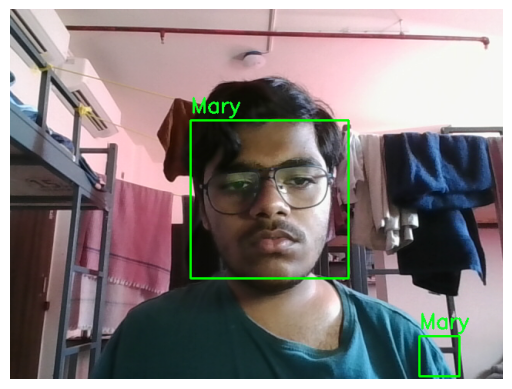

1/1 [==============================] - 0s 20ms/step


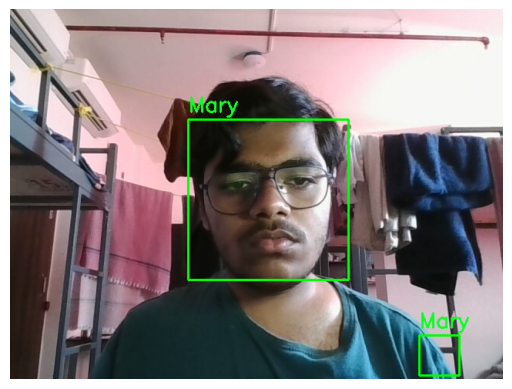

1/1 [==============================] - 0s 20ms/step


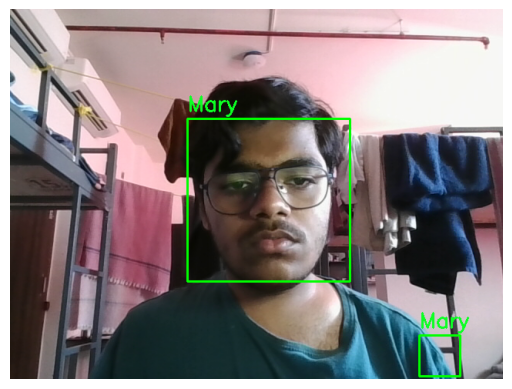

1/1 [==============================] - 0s 20ms/step


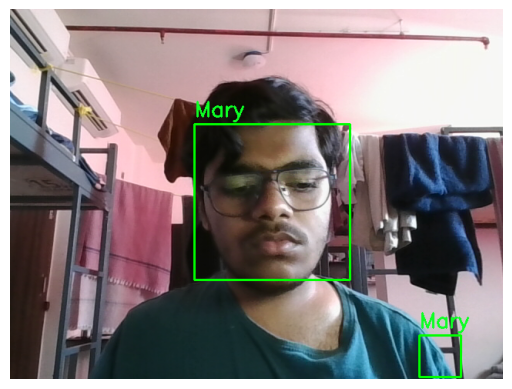

1/1 [==============================] - 0s 19ms/step


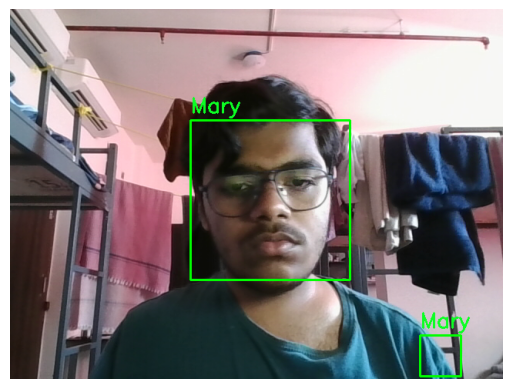

1/1 [==============================] - 0s 21ms/step


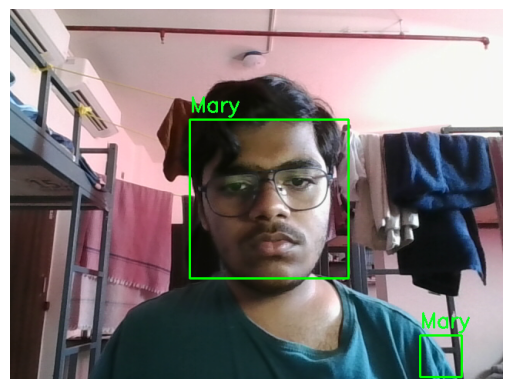

1/1 [==============================] - 0s 22ms/step


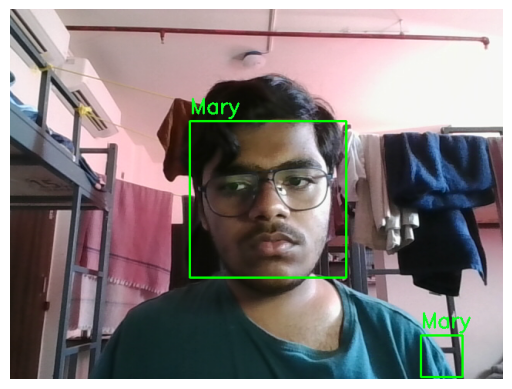

1/1 [==============================] - 0s 21ms/step


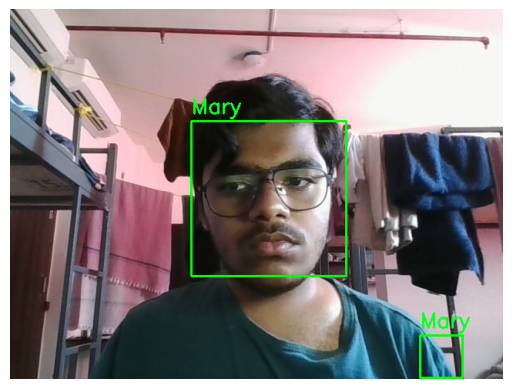

1/1 [==============================] - 0s 21ms/step


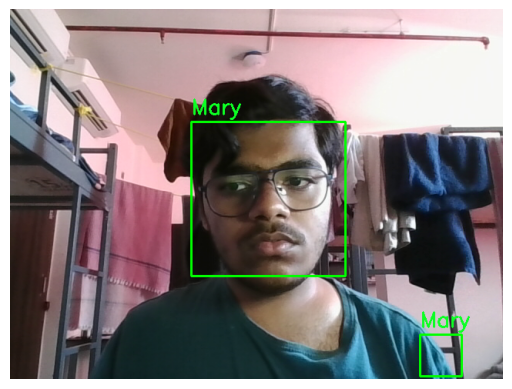

1/1 [==============================] - 0s 21ms/step


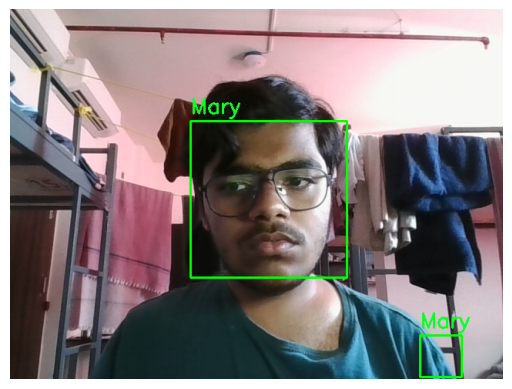

1/1 [==============================] - 0s 20ms/step


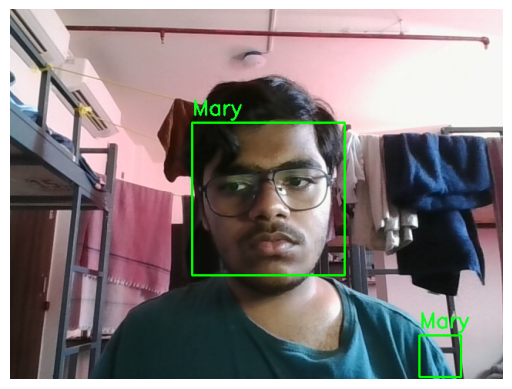

1/1 [==============================] - 0s 21ms/step


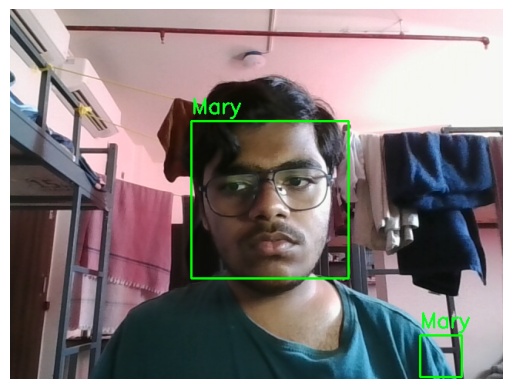

1/1 [==============================] - 0s 24ms/step


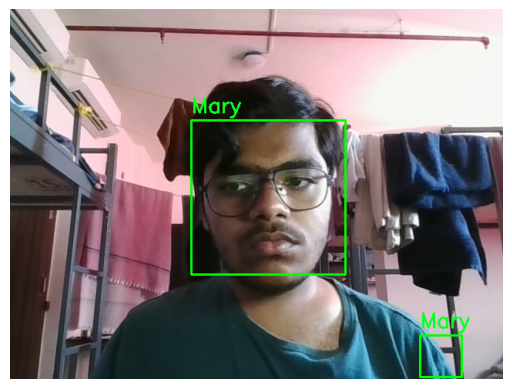

1/1 [==============================] - 0s 21ms/step


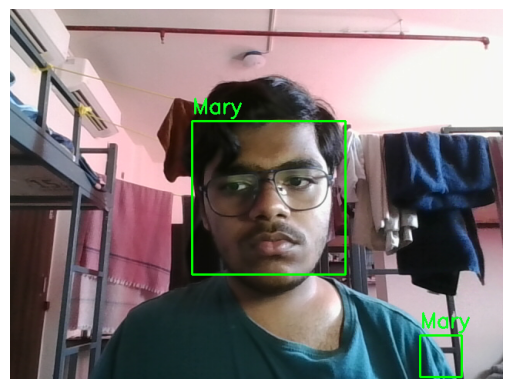

1/1 [==============================] - 0s 21ms/step


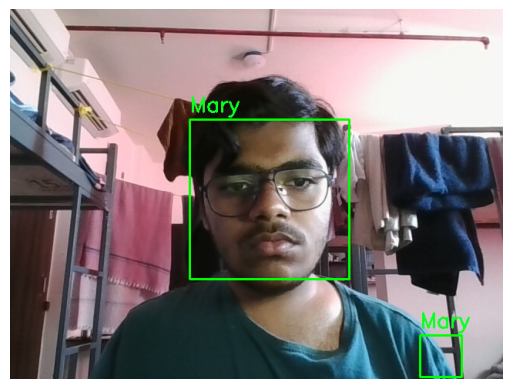

1/1 [==============================] - 0s 20ms/step


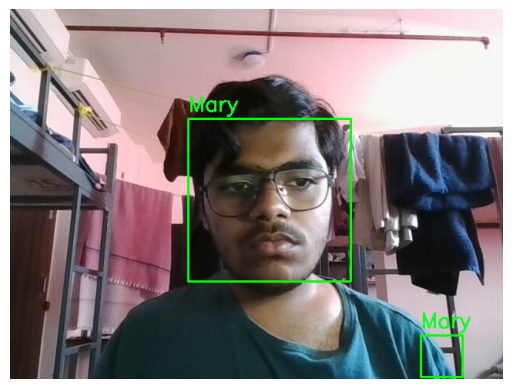

1/1 [==============================] - 0s 21ms/step


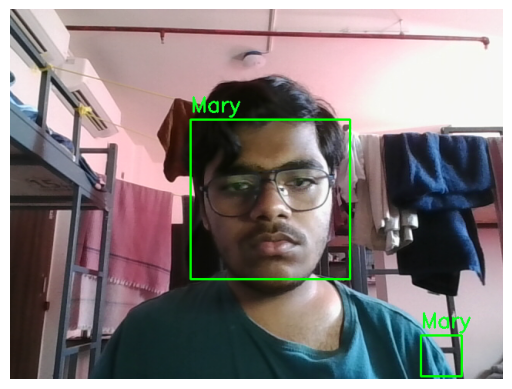

1/1 [==============================] - 0s 22ms/step


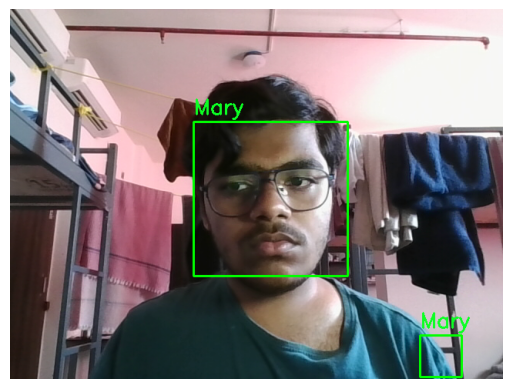

1/1 [==============================] - 0s 21ms/step


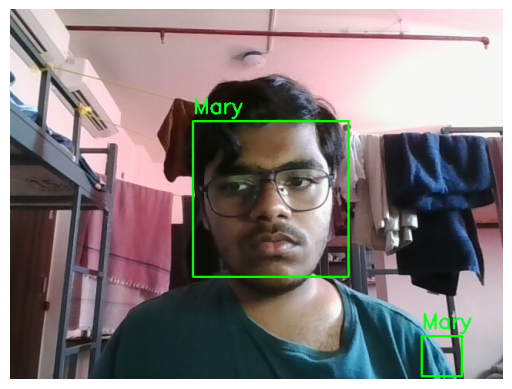

1/1 [==============================] - 0s 20ms/step


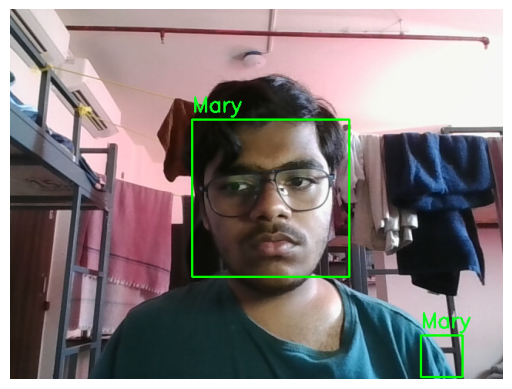

1/1 [==============================] - 0s 21ms/step


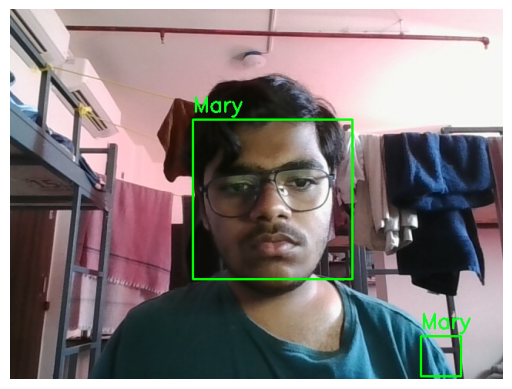

1/1 [==============================] - 0s 19ms/step


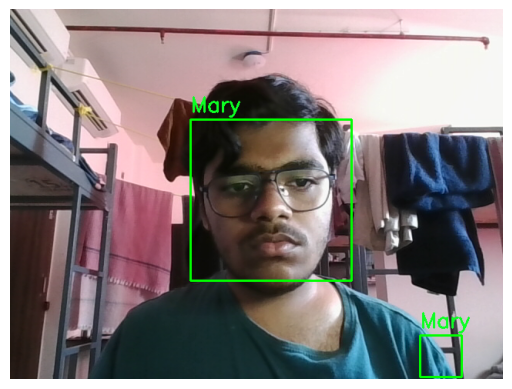

1/1 [==============================] - 0s 21ms/step


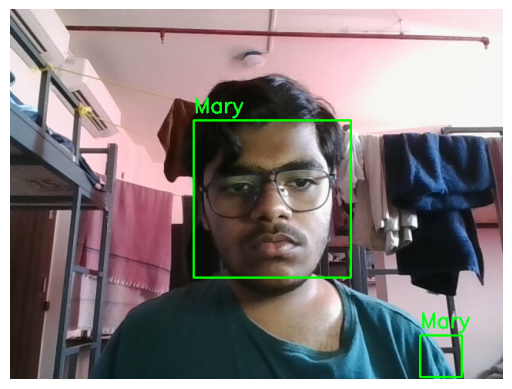

1/1 [==============================] - 0s 21ms/step


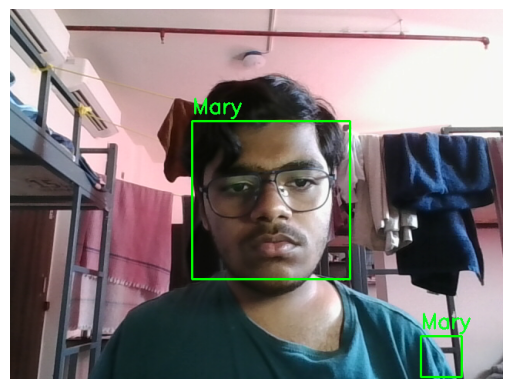

1/1 [==============================] - 0s 20ms/step


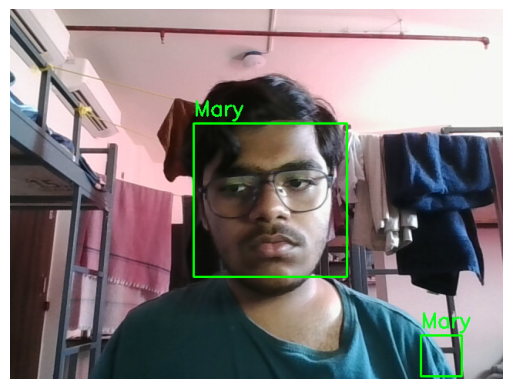

1/1 [==============================] - 0s 20ms/step


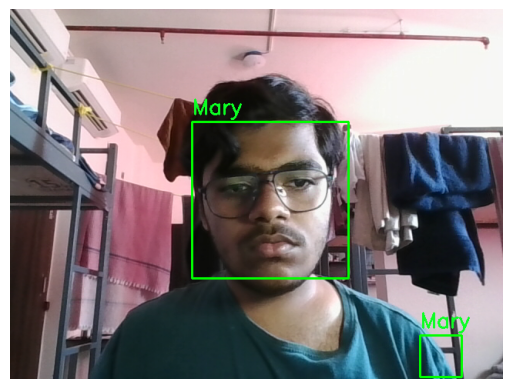

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [2]:
import cv2
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import keyboard

model = tf.keras.models.load_model(r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
dataset = tf.keras.utils.image_dataset_from_directory(r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet2",image_size = (128,128),batch_size=32)
cap = cv2.VideoCapture(0)

while True:
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
        #cv2.putText(frame, 'Face', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)
    
    roi_color = frame[y:y+h, x:x+w]
    roi_color = cv2.resize(roi_color,(128,128))
    roi_color = np.array(roi_color) / 255.0
    roi_color = np.expand_dims(roi_color, axis=0)
    
    predictions = model.predict(roi_color)
    predicted_class = np.argmax(predictions)
    
    for (x,y,w,h) in faces:
        cv2.putText(frame, dataset.class_names[predicted_class], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)
    
    #cv2.imshow('Face Detection', frame)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Turn off axis labels
    plt.show()

    #if cv2.waitKey(1) & 0xFF == ord('q'):
    #break

    if keyboard.is_pressed('q'):
        break

# Release the webcam and close all windows
cap.release()
cv2.destroyAllWindows()


In [ ]:
import tensorflow as tf
model = tf.keras.models.load_model(r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5", compile=False)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
test_loss, test_accuracy = model.evaluate(test_generator)

print('Test accuracy:', test_accuracy)
print('Test loss:', test_loss)

In [6]:
from PIL import Image
# Load the saved model
model = tf.keras.models.load_model(r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")

# Load and preprocess the input image
image = Image.open(r"C:\Users\SHARVIN JOSHI\Pictures\Screenshots\Screenshot 2024-04-08 150111.png")
image = image.resize((128, 128))  # Resize to match model's input shape
image = np.array(image) / 255.0    # Normalize pixel values
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Make predictions
predictions = model.predict(image)

# Assuming it's a classification task, interpret predictions
predicted_class = np.argmax(predictions)
print("Predicted class:", predicted_class)

dataset = tf.keras.utils.image_dataset_from_directory(r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet2",image_size = (128,128),batch_size=32)
dataset.class_names

print("Predicted class:",dataset.class_names[predicted_class])

ValueError: in user code:

    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2440, in predict_function  *
        return step_function(self, iterator)
    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2425, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2413, in run_step  **
        outputs = model.predict_step(data)
    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2381, in predict_step
        return self(x, training=False)
    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\SHARVIN JOSHI\anaconda3\Lib\site-packages\keras\src\engine\input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential" is incompatible with the layer: expected shape=(None, 128, 128, 3), found shape=(None, 128, 128, 4)


xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical

In [ ]:
# dataset = tf.keras.utils.image_dataset_from_directory(r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet",image_size = (128,128),batch_size=32)
# (train_images, train_labels) = next(iter(dataset))

import os
import numpy as np
from sklearn.model_selection import train_test_split

# Define the root directory where your class directories are located
root_dir = r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet"

# Get the list of class directories
class_directories = [os.path.join(root_dir, class_dir) for class_dir in os.listdir(root_dir)]

# Initialize lists to store file paths and corresponding labels
file_paths = []
labels = []

# Iterate through each class directory
for class_dir in class_directories:
    # Get the class label (which is the name of the directory)
    label = os.path.basename(class_dir)
    
    # Get the list of file paths for images in this class directory
    class_file_paths = [os.path.join(class_dir, file) for file in os.listdir(class_dir)]
    
    # Append the file paths and corresponding labels to the lists
    file_paths.extend(class_file_paths)
    labels.extend([label] * len(class_file_paths))

# Convert lists to numpy arrays
file_paths = np.array(file_paths)
labels = np.array(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(file_paths, labels, test_size=0.2, random_state=42)

# Print the shapes of the resulting datasets to verify the split
print("Training data shape:", X_train.shape, y_train.shape)
print("Testing data shape:", X_test.shape, y_test.shape)

In [ ]:
class_names = dataset.class_names
class_names

In [ ]:
# Architecture of the Convolutional Neural Netowrk (CNN)

# Initialising a Sequential model from Tensorflow Keras
model = tf.keras.models.Sequential()

# Adding the first filter layer having the activation function ReLU and a max pooling layer
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(4, 4),strides=(1, 1),padding='valid',activation='relu',input_shape=(128,128,3)))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Second layer of filter and max pool
model.add(tf.keras.layers.Conv2D(filters=16,kernel_size=(4, 4),strides=(1, 1),padding='valid',activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Flattening (converting 3D numpy array to 1D array)
model.add(tf.keras.layers.Flatten())

# Adding the dense layers
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))
model.add(tf.keras.layers.Dense(11, activation='softmax'))

In [ ]:
# Compiling the model using adam optimizer and sparse cross entropy loss function
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
datagen = ImageDataGenerator(
    rotation_range=40,          # randomly rotate images in the range [0, 40] degrees
    width_shift_range=0.2,     # randomly shift images horizontally by up to 20% of the width
    height_shift_range=0.2,    # randomly shift images vertically by up to 20% of the height
    shear_range=0.2,           # apply shear transformations with a maximum shear intensity of 0.2
    zoom_range=0.2,            # randomly zoom into images by up to 20%
    horizontal_flip=True,      # randomly flip images horizontally
    vertical_flip=True,        # randomly flip images vertically
    brightness_range=[0.5, 1.5],  # randomly adjust the brightness of images by a factor between 0.5 and 1.5
    channel_shift_range=20,    # randomly shift the channels of images by up to 20 intensity units
    fill_mode='nearest',       # strategy for filling in newly created pixels
    cval=0,                    # value used for points outside the boundaries when fill_mode is 'constant'
    rescale=1./255             # rescale pixel values to the range [0, 1]
)
# validation_generator = validation_datagen.flow(val_images, val_labels, batch_size=32, shuffle=False)

In [ ]:

# Specify the path to your dataset directory
train_dir = r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet"

# Create a generator for reading images from the directory and applying data augmentation
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='sparse',
)


In [ ]:
num_classes = 3
one_hot_labels = to_categorical(train_labels, num_classes)

In [ ]:
# Training the model
# model.fit(train_images, train_labels, epochs=17, validation_split=0.2)

# Calculate the number of steps per epoch based on the number of batches you want
steps_per_epoch = 3357 // 100  # Assuming you want 32 batches per epoch

# Training the model
model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=15
)

# model.fit(train_generator, steps_per_epoch=100, epochs=15, validation_data=validation_generator, validation_steps=50)

In [ ]:
from tensorflow.keras.models import save_model
save_model(model, r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")

In [ ]:
from PIL import Image
import numpy as np

# Load the saved model
model = tf.keras.models.load_model(r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")

# Load and preprocess the input image
image = Image.open(r"C:\Users\SHARVIN JOSHI\Desktop\P\ATTENDANCE SYSTEM\DataSet\Ninad_image.jpg")
image = image.resize((128, 128))  # Resize to match model's input shape
image = np.array(image) / 255.0    # Normalize pixel values
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Make predictions
predictions = model.predict(image)

# Assuming it's a classification task, interpret predictions
predicted_class = np.argmax(predictions)
print("Predicted class:", predicted_class)

In [ ]:
import os
from tqdm import tqdm
import numpy as np
model = load_model(r"C:\Users\SHARVIN JOSHI\Desktop\P\FACE RECOGNITION\model2.h5")

def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(128, 128))  # adjust target_size according to your model
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    return x
class_labels = class_names
positive=0
os.chdir(r"C:\Users\SHARVIN JOSHI\Desktop\P\REMEMBRON\DataSet\Arnav")

for img_path in tqdm(os.listdir(r"C:\Users\SHARVIN JOSHI\Desktop\P\REMEMBRON\DataSet\Arnav")):

    img = preprocess_image(img_path)

    predictions = model.predict(img)

    scores = []
    for i, score in enumerate(predictions[0]):
        scores.append(score)
    label = class_labels[scores.index(max(scores))]
    if label=='Arnav':
        positive +=1
print(100*(positive/len(os.listdir(r"C:\Users\SHARVIN JOSHI\Desktop\P\REMEMBRON\DataSet\Arnav"))))